# Classification fundamentals

We will try to assign each entry to a label of **0,1,2,3**
We will use the change label as our target column which is dividing the **Year on year % change** of price into **4** different regions. 

    0 =  min to -18
    1 = -18 to -8
    2 = -8 to 4
    3 = 4 to max
   
Each entry is a company's values of **PE, PEG, After Tax ROE, Operating Margin, Profit Margin and Cash Ratio** for a specific year between 2013-2016.

***
## Models
We will use several Machine Learning models to try to achive our hypothesis as we go.

**Decison Tree**
    
**Random Forest**

**Suport Vector Machine**

**Neural Network**

***


## Evaluation metrics
    
    When choosing the evaluation metric it is important to think about what business challenge we are trying to solve using the model. 
    
### The business challenge: find stocks that will give a good return on one year.
Let us look at the frequently used evaluation metrics:
   
    1. Accuracy =  True positive + True negative / Total
    2. Recall = True positive / True positive + False negative
    3. Precision = True positive / True positive + False positive
    
It is important to consider the relative cost of a false negative compared to a false positive. The false positive clearly has a higher cost to a company as it means that the model suggested the stock would go up but in reality it would go down. A false negative would be a prediction where the stock would not to go up but it actually increased. It would be a missed opportunity but it would not imply a loss of capital.

Therefore the evaluation metric we want to pursue a high score on is **Precision for Label 3.**

As we see here, "accuracy" might not be the score we would consider the most important but the **Precsion** metric would be, especially for class 3 (4% and above YoY price increase). As precision is a binary metric we will use the average precision and also print a classification report that will show the different preicsion, recalls, and F1-score for each class.
    
source(https://towardsdatascience.com/accuracy-precision-recall-or-f1-331fb37c5cb9)
            
  ****


In [65]:
import sklearn.metrics as metrics
print(metrics.SCORERS.keys())


dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'accuracy', 'roc_auc', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'brier_score_loss', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted'])


In [66]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [67]:
fund = pd.read_csv("./preprocessing/fundamentals_preprocessed_final.csv", index_col=0)
print("The shape of the data is:",fund.shape)

##Shuffle
fund = fund.reindex(np.random.permutation(fund.index))
fund.reset_index(inplace=True, drop=True)

fund.head()

The shape of the data is: (999, 11)


,year,symbol,change in 12 months,PE,PEG,After Tax ROE,Gross Margin,Operating Margin,Profit Margin,Cash Ratio,changeLabel
0,2014,CVS,-15.689474,21.223618,3.810145,12.0,18.0,6.0,3.0,13.00000,1
1,2015,TEL,-12.874146,10.773411,0.285101,25.0,33.0,14.0,20.0,93.00000,1
2,2015,WY,8.904423,37.191011,-0.515200,10.0,20.0,13.0,7.0,116.00000,3
3,2015,CAG,-19.599530,-50.000000,0.277856,6.0,24.0,11.0,2.0,5.00000,0
4,2013,SCHW,-49.437403,25.878206,1.983996,10.0,100.0,31.0,20.0,74.45749,0


## Split into features and labels 

In [68]:

X = fund.iloc[:,3:10] #All columns except 'year','symbol' and 'ChangeLabel'
y = fund.iloc[:, 10:] # ChangeLabel

print("Feature columns are : ", X.columns.values)
print("Label column is: ", y.columns.values)

columns = X.columns


X = X.values
y = y.values.ravel() #Return the flattened underlying data as a ndarray.

np.unique(y, return_counts=True) #Check how many values there are assigned to each label.


Feature columns are :  ['PE' 'PEG' 'After Tax ROE' 'Gross Margin' 'Operating Margin'
 'Profit Margin' 'Cash Ratio']
Label column is:  ['changeLabel']


(array([0, 1, 2, 3]), array([262, 245, 251, 241]))

    262 labels of class 0
    245 labels of class 1
    251 labels of class 2
    241 labels of class 3


***

# Rescaling

### Benifits 
Many machine learning algorithms can benifit from rescaling the features to the same scale. In our particular case it is important because a Neural Network's optimization algorithms benifit from it (Gradient Descent). It also benefits algorithms that use distance measures, such as KNN, which we are planning to use in the next step of analysing our features.

It might not be a good idea to scale features with outliers around mean and variance of the data.
As Sklearn documentation suggests, we will use **robust_scale** or **RobustScaler.** They use more robust estimates for the center and range of our data.

In [69]:
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split


transformer = RobustScaler().fit(X)
X = transformer.transform(X)

##Split the data
X_train, X_test, y_train, y_test = train_test_split(    
    X, y, test_size=0.15, random_state=42) 

X_test.shape

X_train.shape
print("10 first rows of the scaled training set")
X_train[:10]


10 first rows of the scaled training set


array([[ 3.45e-04,  3.87e-01,  1.29e-01, -1.27e-01, -8.00e-02, -1.00e-01,
         1.95e+00],
       [-5.88e-01,  2.15e-02, -4.52e-01, -1.33e+00, -1.20e+00,  1.00e+00,
         4.41e-01],
       [ 1.05e+00,  2.45e+00, -4.52e-01,  1.84e+00,  1.84e+00,  3.00e+00,
         4.41e-01],
       [-5.85e+00,  1.78e-01, -8.39e-01, -2.22e-01, -9.60e-01, -9.00e-01,
        -1.08e-01],
       [ 2.29e+00, -1.20e+00, -1.29e-01,  1.05e+00,  8.00e-02,  3.00e-01,
         6.85e-01],
       [-9.95e-01,  1.59e-01, -2.58e-01, -3.49e-01,  8.00e-02,  1.00e-01,
        -8.84e-01],
       [-2.57e-01, -1.03e+01, -1.94e-01,  1.84e+00,  9.60e-01,  9.00e-01,
         3.07e-01],
       [ 6.96e-01, -1.99e+00,  5.68e+00,  6.98e-01,  7.20e-01,  6.00e-01,
         1.55e+00],
       [ 2.61e+00, -1.45e+00, -4.52e-01,  6.67e-01, -2.40e-01,  0.00e+00,
        -5.41e-02],
       [ 8.67e-02,  4.54e+00,  5.16e-01,  0.00e+00,  1.60e-01,  3.00e-01,
         1.44e-01]])

****

# Decision Trees
Decision Trees can be used for both classification and regression, and they are interpretable. Also, by its nature, it gives us the feature importance which will give us an understanding of what features the learning algorithm considers the most important.

Let us try to classify our data with a DescisionTreeClassifier from sklearn. It implements **the CART algorithm**.


In [70]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,recall_score,precision_score,f1_score
from sklearn.metrics import confusion_matrix, classification_report, average_precision_score, accuracy_score
import seaborn as sns

## Hyperparameter tuning
We are using sklearns DecisionTreeClassifier for classification.

# Parameters:
        
### Criterion, str optional (default=”gini”)
    
**Criteria to choose: "entropy" and "gini"**

    This is the function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain. (Sklearn)
    
***
    
## Splitter,str optional (default=”best”)

    Splitter to choose: "best" and "random"
        
  
***

### Max_depth: int or None, optional (default=None)
    Indication of how deep the tree can be. The deeper the tree, the more information it can get by having more splits.



***
      
   
### We will use sklearn's GridSearchCV (Grid Search Cross Validation) to find the best hyperparameters
Gridsearch makes it possible to specify a grid with different parameter values.
When initlizing it, we set the Cross Validation parameter to 10 to get a **10 Cross Fold** and therefore getting an average precision result on the different set up of parameters. This also makes it possible to use the **X_test** as a hold out test when we have decided what parameters to use.

In [71]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score

grid = param_grid={
            'criterion': ["gini", "entropy"],
            'splitter': ["random", "best"],
            'max_depth': [5,10, 20, 50,100,200,400,600,700, 900, 1000,20000, None],
        }

gs = GridSearchCV(DecisionTreeClassifier(),grid,verbose=3, cv=10, scoring='precision_micro')
        
model = gs.fit(X_train, y_train)

pred = model.predict(X_test)


# print best parameter after tuning 
print(model.best_params_) 
  
# print how our model looks after hyper-parameter tuning 
print(model.best_estimator_) 

print(model.best_score_)




Fitting 10 folds for each of 52 candidates, totalling 520 fits
[CV] criterion=gini, max_depth=5, splitter=random ....................
[CV]  criterion=gini, max_depth=5, splitter=random, score=0.233, total=   0.0s
[CV] criterion=gini, max_depth=5, splitter=random ....................
[CV]  criterion=gini, max_depth=5, splitter=random, score=0.291, total=   0.0s
[CV] criterion=gini, max_depth=5, splitter=random ....................
[CV]  criterion=gini, max_depth=5, splitter=random, score=0.244, total=   0.0s
[CV] criterion=gini, max_depth=5, splitter=random ....................
[CV]  criterion=gini, max_depth=5, splitter=random, score=0.259, total=   0.0s
[CV] criterion=gini, max_depth=5, splitter=random ....................
[CV]  criterion=gini, max_depth=5, splitter=random, score=0.224, total=   0.0s
[CV] criterion=gini, max_depth=5, splitter=random ....................
[CV]  criterion=gini, max_depth=5, splitter=random, score=0.235, total=   0.0s
[CV] criterion=gini, max_depth=5, spl

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  criterion=gini, max_depth=50, splitter=random, score=0.224, total=   0.0s
[CV] criterion=gini, max_depth=50, splitter=random ...................
[CV]  criterion=gini, max_depth=50, splitter=random, score=0.259, total=   0.0s
[CV] criterion=gini, max_depth=50, splitter=random ...................
[CV]  criterion=gini, max_depth=50, splitter=random, score=0.238, total=   0.0s
[CV] criterion=gini, max_depth=50, splitter=random ...................
[CV]  criterion=gini, max_depth=50, splitter=random, score=0.298, total=   0.0s
[CV] criterion=gini, max_depth=50, splitter=random ...................
[CV]  criterion=gini, max_depth=50, splitter=random, score=0.286, total=   0.0s
[CV] criterion=gini, max_depth=50, splitter=random ...................
[CV]  criterion=gini, max_depth=50, splitter=random, score=0.333, total=   0.0s
[CV] criterion=gini, max_depth=50, splitter=best .....................
[CV]  criterion=gini, max_depth=50, splitter=best, score=0.279, total=   0.0s
[CV] criterion=g

[CV]  criterion=gini, max_depth=700, splitter=random, score=0.310, total=   0.0s
[CV] criterion=gini, max_depth=700, splitter=best ....................
[CV]  criterion=gini, max_depth=700, splitter=best, score=0.244, total=   0.0s
[CV] criterion=gini, max_depth=700, splitter=best ....................
[CV]  criterion=gini, max_depth=700, splitter=best, score=0.291, total=   0.0s
[CV] criterion=gini, max_depth=700, splitter=best ....................
[CV]  criterion=gini, max_depth=700, splitter=best, score=0.221, total=   0.0s
[CV] criterion=gini, max_depth=700, splitter=best ....................
[CV]  criterion=gini, max_depth=700, splitter=best, score=0.212, total=   0.0s
[CV] criterion=gini, max_depth=700, splitter=best ....................
[CV]  criterion=gini, max_depth=700, splitter=best, score=0.294, total=   0.0s
[CV] criterion=gini, max_depth=700, splitter=best ....................
[CV]  criterion=gini, max_depth=700, splitter=best, score=0.294, total=   0.0s
[CV] criterion=gini

[CV]  criterion=entropy, max_depth=5, splitter=best, score=0.247, total=   0.0s
[CV] criterion=entropy, max_depth=5, splitter=best ...................
[CV]  criterion=entropy, max_depth=5, splitter=best, score=0.250, total=   0.0s
[CV] criterion=entropy, max_depth=5, splitter=best ...................
[CV]  criterion=entropy, max_depth=5, splitter=best, score=0.262, total=   0.0s
[CV] criterion=entropy, max_depth=5, splitter=best ...................
[CV]  criterion=entropy, max_depth=5, splitter=best, score=0.202, total=   0.0s
[CV] criterion=entropy, max_depth=5, splitter=best ...................
[CV]  criterion=entropy, max_depth=5, splitter=best, score=0.262, total=   0.0s
[CV] criterion=entropy, max_depth=10, splitter=random ................
[CV]  criterion=entropy, max_depth=10, splitter=random, score=0.256, total=   0.0s
[CV] criterion=entropy, max_depth=10, splitter=random ................
[CV]  criterion=entropy, max_depth=10, splitter=random, score=0.314, total=   0.0s
[CV] cri

[CV]  criterion=entropy, max_depth=100, splitter=best, score=0.314, total=   0.0s
[CV] criterion=entropy, max_depth=100, splitter=best .................
[CV]  criterion=entropy, max_depth=100, splitter=best, score=0.221, total=   0.0s
[CV] criterion=entropy, max_depth=100, splitter=best .................
[CV]  criterion=entropy, max_depth=100, splitter=best, score=0.279, total=   0.0s
[CV] criterion=entropy, max_depth=100, splitter=best .................
[CV]  criterion=entropy, max_depth=100, splitter=best, score=0.318, total=   0.0s
[CV] criterion=entropy, max_depth=100, splitter=best .................
[CV]  criterion=entropy, max_depth=100, splitter=best, score=0.353, total=   0.0s
[CV] criterion=entropy, max_depth=100, splitter=best .................
[CV]  criterion=entropy, max_depth=100, splitter=best, score=0.271, total=   0.0s
[CV] criterion=entropy, max_depth=100, splitter=best .................
[CV]  criterion=entropy, max_depth=100, splitter=best, score=0.202, total=   0.0s


[CV]  criterion=entropy, max_depth=600, splitter=best, score=0.314, total=   0.0s
[CV] criterion=entropy, max_depth=600, splitter=best .................
[CV]  criterion=entropy, max_depth=600, splitter=best, score=0.198, total=   0.0s
[CV] criterion=entropy, max_depth=600, splitter=best .................
[CV]  criterion=entropy, max_depth=600, splitter=best, score=0.221, total=   0.0s
[CV] criterion=entropy, max_depth=600, splitter=best .................
[CV]  criterion=entropy, max_depth=600, splitter=best, score=0.329, total=   0.0s
[CV] criterion=entropy, max_depth=600, splitter=best .................
[CV]  criterion=entropy, max_depth=600, splitter=best, score=0.329, total=   0.0s
[CV] criterion=entropy, max_depth=600, splitter=best .................
[CV]  criterion=entropy, max_depth=600, splitter=best, score=0.282, total=   0.0s
[CV] criterion=entropy, max_depth=600, splitter=best .................
[CV]  criterion=entropy, max_depth=600, splitter=best, score=0.238, total=   0.0s


[CV]  criterion=entropy, max_depth=1000, splitter=best, score=0.244, total=   0.0s
[CV] criterion=entropy, max_depth=1000, splitter=best ................
[CV]  criterion=entropy, max_depth=1000, splitter=best, score=0.329, total=   0.0s
[CV] criterion=entropy, max_depth=1000, splitter=best ................
[CV]  criterion=entropy, max_depth=1000, splitter=best, score=0.318, total=   0.0s
[CV] criterion=entropy, max_depth=1000, splitter=best ................
[CV]  criterion=entropy, max_depth=1000, splitter=best, score=0.271, total=   0.0s
[CV] criterion=entropy, max_depth=1000, splitter=best ................
[CV]  criterion=entropy, max_depth=1000, splitter=best, score=0.226, total=   0.0s
[CV] criterion=entropy, max_depth=1000, splitter=best ................
[CV]  criterion=entropy, max_depth=1000, splitter=best, score=0.321, total=   0.0s
[CV] criterion=entropy, max_depth=1000, splitter=best ................
[CV]  criterion=entropy, max_depth=1000, splitter=best, score=0.286, total= 

[Parallel(n_jobs=1)]: Done 520 out of 520 | elapsed:    2.6s finished
/home/douglas/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


When we ran the code above we got different results on the best parameters. This indicates that there are no optimal parameters. However, we will use the latest output's best parameters and find out how the Decsion Tree is performing.

## Training


Accuarcy:  0.26666666666666666
              precision    recall  f1-score   support

     class 0       0.24      0.28      0.26        36
     class 1       0.34      0.24      0.28        42
     class 2       0.29      0.39      0.33        31
     class 3       0.21      0.20      0.20        41

    accuracy                           0.27       150
   macro avg       0.27      0.27      0.27       150
weighted avg       0.27      0.27      0.26       150

[42 29 41 38]
Recall:  [0.278 0.238 0.387 0.195]
Precision:  [0.238 0.345 0.293 0.211]


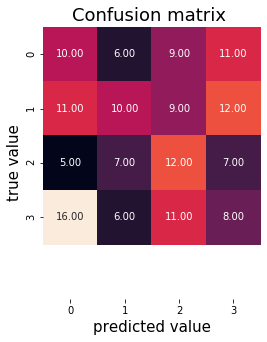

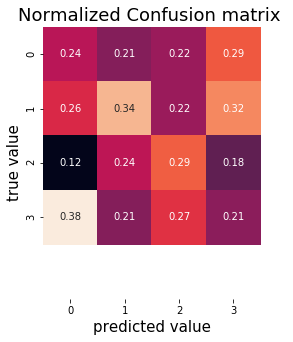

In [72]:
tree = DecisionTreeClassifier(criterion = 'entropy', max_depth=900, splitter='random').fit(X_train,y_train)

y_pred = tree.predict(X_test)

##Evaulation
np.set_printoptions(precision=3)

acc = accuracy_score(y_test, y_pred)
print("Accuarcy: ", acc)

target_names = ['class 0', 'class 1', 'class 2', 'class 3']
print( classification_report(y_test, y_pred,  target_names=target_names))

##Confusion matrix
cm = confusion_matrix(y_test, y_pred)
normalizedCm = cm.astype(float) / np.sum(cm, axis=0)


print(np.sum(cm, axis=0))

recall = np.diag(cm) / np.sum(cm, axis = 1)
precision = np.diag(cm) / np.sum(cm, axis = 0)
print("Recall: ", recall)
print("Precision: ", precision)


##Normalized confusion matrix
plt.figure(figsize=(5,5))
#Show confion matrix 
plt.title("Confusion matrix ", fontsize=18)
ax = sns.heatmap(cm, fmt='.2f', square=True, annot=True, cbar=False)
ax.set_ylim(5,0) #maked heatmap showiung all squares
plt.xlabel('predicted value', fontsize=15)
plt.ylabel('true value',  fontsize=15);

np.set_printoptions(precision=2)
##Normalized confusion matrix
plt.figure(figsize=(5,5))
#Show confion matrix 
plt.title("Normalized Confusion matrix ", fontsize=18)
ax = sns.heatmap(normalizedCm, fmt='.2f', square=True, annot=True, cbar=False)
ax.set_ylim(5,0) #maked heatmap showiung all squares
plt.xlabel('predicted value', fontsize=15)
plt.ylabel('true value',  fontsize=15);


***

### Feature importance

In [73]:
importance  = dict(zip(columns,tree.feature_importances_))

print(importance)

{'PE': 0.1561307260761864, 'PEG': 0.16036198619675257, 'After Tax ROE': 0.1473647452227932, 'Gross Margin': 0.13974910950975877, 'Operating Margin': 0.11016586112876413, 'Profit Margin': 0.139028091135827, 'Cash Ratio': 0.1471994807299181}


### The PEG, PE and after TAX ROE seems to be the most important features

## Visualize Decison Tree

In [27]:
from sklearn.tree import export_graphviz# Export as dot file
export_graphviz(tree, 
                out_file='tree.dot', 
                feature_names = fund.iloc[:,3:10].columns,
                class_names = ["0","1","2","3"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)


# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])



# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

# Random Forest

It uses the technique of Bagging that (Breiman, 1996) invented. A technique that fits many large trees to bootstrap-resample version of the training data, and classifies by majority vote. In the hyperparameter tuning the n_estimator i is specifying how many trees to consider.

There are two components of the random forest:

The bootstrapping: it is drawing (xi*, yi*) uniformly from the training data. That means that some of the training data is represented more than once in a sample and some are not represented at all.

The bagging: Average the predicitons from the classification trees of the bootstrap samples. Therefore it helps to decrease the misclassification rate of the classifier.


In [28]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

## Hyper parameter tuning

### max_depth
How deep the tree can get
### n_estimators
The number of trees in the forest
### max_features
The number of features to consider when considering a split

In [29]:


from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score

grid = param_grid={
            'criterion': ["gini", "entropy"],
            'n_estimators': (10, 30, 50, 100, 200, 400, 600, 800, 1000),
            'max_features': (2,4,6),
            'max_depth': [3, None],
        }



gs = GridSearchCV(RandomForestClassifier(),grid,verbose=3, cv=10, scoring='precision_micro')
        
model = gs.fit(X_train, y_train)

pred = model.predict(X_test)


# print best parameter after tuning 
print(model.best_params_) 
  
# print how our model looks after hyper-parameter tuning 
print(model.best_estimator_) 

print(model.best_score_)




Fitting 10 folds for each of 108 candidates, totalling 1080 fits
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=10 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=10, score=0.244, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=10 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=10, score=0.235, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=10 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=10, score=0.306, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=10 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=10, score=0.400, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=10 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=10, score=0.294, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=10 ....
[CV]  criterion=gini, max_depth=3,

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=30, score=0.388, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=30 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=30, score=0.318, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=30 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=30, score=0.224, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=30 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=30, score=0.271, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=30 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=30, score=0.212, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=30 ....
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=30, score=0.259, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=30 ....
[CV]

[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=600, score=0.341, total=   0.4s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=600 ...
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=600, score=0.282, total=   0.5s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=600 ...
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=600, score=0.247, total=   0.4s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=600 ...
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=600, score=0.306, total=   0.4s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=600 ...
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=600, score=0.271, total=   0.4s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=600 ...
[CV]  criterion=gini, max_depth=3, max_features=2, n_estimators=600, score=0.247, total=   0.4s
[CV] criterion=gini, max_depth=3, max_features=2, n_estimators=600 ..

[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=50, score=0.212, total=   0.1s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=50 ....
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=50, score=0.212, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=50 ....
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=50, score=0.294, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=50 ....
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=50, score=0.259, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=50 ....
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=50, score=0.235, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=50 ....
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=50, score=0.313, total=   0.0s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=100 ...
[CV]

[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=800, score=0.271, total=   0.8s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=800 ...
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=800, score=0.200, total=   0.7s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=800 ...
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=800, score=0.294, total=   0.7s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=800 ...
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=800, score=0.271, total=   0.7s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=800 ...
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=800, score=0.224, total=   0.7s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=800 ...
[CV]  criterion=gini, max_depth=3, max_features=4, n_estimators=800, score=0.289, total=   0.7s
[CV] criterion=gini, max_depth=3, max_features=4, n_estimators=1000 .

[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=100, score=0.200, total=   0.1s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=100 ...
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=100, score=0.318, total=   0.1s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=100 ...
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=100, score=0.259, total=   0.2s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=100 ...
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=100, score=0.318, total=   0.2s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=100 ...
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=100, score=0.313, total=   0.1s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=200 ...
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=200, score=0.291, total=   0.3s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=200 ..

[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=1000, score=0.235, total=   1.2s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=1000 ..
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=1000, score=0.306, total=   1.1s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=1000 ..
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=1000, score=0.282, total=   1.1s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=1000 ..
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=1000, score=0.224, total=   1.1s
[CV] criterion=gini, max_depth=3, max_features=6, n_estimators=1000 ..
[CV]  criterion=gini, max_depth=3, max_features=6, n_estimators=1000, score=0.301, total=   1.1s
[CV] criterion=gini, max_depth=None, max_features=2, n_estimators=10 .
[CV]  criterion=gini, max_depth=None, max_features=2, n_estimators=10, score=0.244, total=   0.0s
[CV] criterion=gini, max_depth=None, max_features=2, n_estimat

[CV]  criterion=gini, max_depth=None, max_features=2, n_estimators=200, score=0.318, total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=2, n_estimators=200 
[CV]  criterion=gini, max_depth=None, max_features=2, n_estimators=200, score=0.282, total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=2, n_estimators=200 
[CV]  criterion=gini, max_depth=None, max_features=2, n_estimators=200, score=0.224, total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=2, n_estimators=200 
[CV]  criterion=gini, max_depth=None, max_features=2, n_estimators=200, score=0.306, total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=2, n_estimators=200 
[CV]  criterion=gini, max_depth=None, max_features=2, n_estimators=200, score=0.200, total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=2, n_estimators=200 
[CV]  criterion=gini, max_depth=None, max_features=2, n_estimators=200, score=0.253, total=   0.3s
[CV] criterion=gini, max_depth=None, max_features=2

[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=30, score=0.314, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=30 .
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=30, score=0.306, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=30 .
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=30, score=0.224, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=30 .
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=30, score=0.318, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=30 .
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=30, score=0.271, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=30 .
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=30, score=0.329, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=4, n_es

[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=400, score=0.277, total=   0.8s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=600, score=0.337, total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=600, score=0.271, total=   1.1s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=600, score=0.247, total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=600, score=0.365, total=   1.2s
[CV] criterion=gini, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=gini, max_depth=None, max_features=4, n_estimators=600, score=0.294, total=   1.3s
[CV] criterion=gini, max_depth=None, max_features=4

[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=50, score=0.337, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=50 .
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=50, score=0.247, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=50 .
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=50, score=0.235, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=50 .
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=50, score=0.353, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=50 .
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=50, score=0.329, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=50 .
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=50, score=0.259, total=   0.1s
[CV] criterion=gini, max_depth=None, max_features=6, n_es

[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=600, score=0.265, total=   1.5s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=800 
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=800, score=0.291, total=   2.0s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=800 
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=800, score=0.247, total=   2.0s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=800 
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=800, score=0.235, total=   2.0s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=800 
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=800, score=0.341, total=   2.0s
[CV] criterion=gini, max_depth=None, max_features=6, n_estimators=800 
[CV]  criterion=gini, max_depth=None, max_features=6, n_estimators=800, score=0.318, total=   2.1s
[CV] criterion=gini, max_depth=None, max_features=6

[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=100, score=0.314, total=   0.1s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=100, score=0.271, total=   0.1s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=100, score=0.235, total=   0.1s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=100, score=0.318, total=   0.1s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=100, score=0.306, total=   0.1s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=100 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=100, score=0.188, total=   0.1s
[CV] criterion=entropy, max_depth=3, max_features=2

[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=800, score=0.313, total=   0.9s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=1000 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=1000, score=0.302, total=   1.1s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=1000 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=1000, score=0.294, total=   1.1s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=1000 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=1000, score=0.282, total=   1.0s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=1000 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=1000, score=0.341, total=   1.1s
[CV] criterion=entropy, max_depth=3, max_features=2, n_estimators=1000 
[CV]  criterion=entropy, max_depth=3, max_features=2, n_estimators=1000, score=0.282, total=   1.2s
[CV] criterion=entropy, max_depth=3, max_

[CV]  criterion=entropy, max_depth=3, max_features=4, n_estimators=100, score=0.289, total=   0.1s
[CV] criterion=entropy, max_depth=3, max_features=4, n_estimators=200 
[CV]  criterion=entropy, max_depth=3, max_features=4, n_estimators=200, score=0.256, total=   0.3s
[CV] criterion=entropy, max_depth=3, max_features=4, n_estimators=200 
[CV]  criterion=entropy, max_depth=3, max_features=4, n_estimators=200, score=0.259, total=   0.3s
[CV] criterion=entropy, max_depth=3, max_features=4, n_estimators=200 
[CV]  criterion=entropy, max_depth=3, max_features=4, n_estimators=200, score=0.282, total=   0.3s
[CV] criterion=entropy, max_depth=3, max_features=4, n_estimators=200 
[CV]  criterion=entropy, max_depth=3, max_features=4, n_estimators=200, score=0.341, total=   0.3s
[CV] criterion=entropy, max_depth=3, max_features=4, n_estimators=200 
[CV]  criterion=entropy, max_depth=3, max_features=4, n_estimators=200, score=0.271, total=   0.3s
[CV] criterion=entropy, max_depth=3, max_features=4

[CV]  criterion=entropy, max_depth=3, max_features=4, n_estimators=1000, score=0.247, total=   1.5s
[CV] criterion=entropy, max_depth=3, max_features=4, n_estimators=1000 
[CV]  criterion=entropy, max_depth=3, max_features=4, n_estimators=1000, score=0.289, total=   1.5s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=10 .
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=10, score=0.244, total=   0.0s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=10 .
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=10, score=0.212, total=   0.0s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=10 .
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=10, score=0.294, total=   0.0s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=10 .
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=10, score=0.306, total=   0.0s
[CV] criterion=entropy, max_depth=3, max_features=6,

[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=200, score=0.247, total=   0.3s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=200 
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=200, score=0.235, total=   0.3s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=200 
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=200, score=0.277, total=   0.4s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=400 
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=400, score=0.314, total=   0.8s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=400 
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=400, score=0.306, total=   0.9s
[CV] criterion=entropy, max_depth=3, max_features=6, n_estimators=400 
[CV]  criterion=entropy, max_depth=3, max_features=6, n_estimators=400, score=0.247, total=   0.9s
[CV] criterion=entropy, max_depth=3, max_features=6

[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=10, score=0.235, total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=10, score=0.294, total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=10 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=10, score=0.277, total=   0.0s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=30, score=0.302, total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=30, score=0.294, total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=30, score=0.259, total=   0.1s
[CV] criterion=entropy, max_d

[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=400, score=0.306, total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=400 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=400, score=0.235, total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=400 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=400, score=0.282, total=   1.1s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=400 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=400, score=0.247, total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=400 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=400, score=0.235, total=   1.0s
[CV] criterion=entropy, max_depth=None, max_features=2, n_estimators=400 
[CV]  criterion=entropy, max_depth=None, max_features=2, n_estimators=400, score=0.277, total=   1.0s
[CV] criterion=ent

[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=30, score=0.235, total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=30, score=0.247, total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=30, score=0.329, total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=30, score=0.224, total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=30, score=0.259, total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=30, score=0.271, total=   0.1s
[CV] criterion=entropy, max_d

[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=400, score=0.247, total=   1.8s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=400 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=400, score=0.325, total=   2.0s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=600, score=0.326, total=   3.0s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=600, score=0.271, total=   2.4s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=600, score=0.224, total=   2.4s
[CV] criterion=entropy, max_depth=None, max_features=4, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=4, n_estimators=600, score=0.341, total=   2.5s
[CV] criterion=ent

[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=30, score=0.329, total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=30, score=0.235, total=   0.1s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=30, score=0.282, total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=30 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=30, score=0.229, total=   0.2s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=50, score=0.279, total=   0.3s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=50 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=50, score=0.224, total=   0.3s
[CV] criterion=entropy, max_d

[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=600, score=0.318, total=   3.2s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=600, score=0.282, total=   3.3s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=600, score=0.259, total=   3.4s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=600, score=0.282, total=   3.3s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=600, score=0.200, total=   3.3s
[CV] criterion=entropy, max_depth=None, max_features=6, n_estimators=600 
[CV]  criterion=entropy, max_depth=None, max_features=6, n_estimators=600, score=0.247, total=   3.3s
[CV] criterion=ent

[Parallel(n_jobs=1)]: Done 1080 out of 1080 | elapsed: 13.7min finished
/home/douglas/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


As suggested it takes longer to run this for mainly two reasons. First is that we have more different parameters to compare and also that when the n_estimator is increasing, it increases the number of trees to be built.

## Pick the hyperparameters

[1 0 0 1 0 2 1 3 3 0 2 3 0 0 2 2 3 0 0 0]
[2 0 2 2 1 3 3 0 3 1 0 3 2 0 1 1 3 2 1 3]
Accuracy:  0.24666666666666667
[[13 11  8 11]
 [16  9  8  3]
 [15 13  6  6]
 [ 6  9  7  9]]
[[0.26 0.26 0.28 0.38]
 [0.32 0.21 0.28 0.1 ]
 [0.3  0.31 0.21 0.21]
 [0.12 0.21 0.24 0.31]]
              precision    recall  f1-score   support

           0       0.26      0.30      0.28        43
           1       0.21      0.25      0.23        36
           2       0.21      0.15      0.17        40
           3       0.31      0.29      0.30        31

    accuracy                           0.25       150
   macro avg       0.25      0.25      0.25       150
weighted avg       0.25      0.25      0.24       150



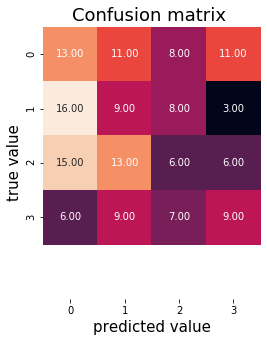

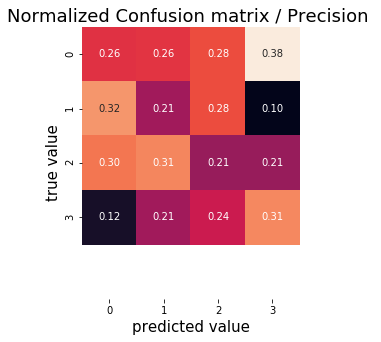

In [32]:
Random_Forest_model = RandomForestClassifier(n_estimators=10,criterion="entropy", max_depth=3, max_features=2)


Random_Forest_model.fit(X_train, y_train)

y_pred = Random_Forest_model.predict(X_test)


print(y_pred[:20])
print(y_test[:20])
acc = accuracy_score(y_test,y_pred)
print("Accuracy: ", acc )
cm = confusion_matrix(y_test, y_pred)
normalizedCm = cm/ np.sum(cm, axis=0)
print(cm)
print(normalizedCm)


print(classification_report(y_test, y_pred))
##Normalized confusion matrix
plt.figure(figsize=(5,5))
#Show confion matrix 
plt.title("Confusion matrix ", fontsize=18)
ax = sns.heatmap(cm, fmt='.2f', square=True, annot=True, cbar=False)
ax.set_ylim(5,0) #maked heatmap showiung all squares
plt.xlabel('predicted value', fontsize=15)
plt.ylabel('true value',  fontsize=15);

np.set_printoptions(precision=2)
##Normalized confusion matrix
plt.figure(figsize=(5,5))
#Show confion matrix 
plt.title("Normalized Confusion matrix / Precision ", fontsize=18)
ax = sns.heatmap(normalizedCm, fmt='.2f', square=True, annot=True, cbar=False)
ax.set_ylim(5,0) #maked heatmap showiung all squares
plt.xlabel('predicted value', fontsize=15)
plt.ylabel('true value',  fontsize=15);

# Support vector machines 

We will try a Support Vector Machine with a kernel that maps the input space into a higher dimension in order to make it linear separable. We choose the kernel hyperparameter to be **'rbf' (radial basis function)** as it implements the **kernel trick**.

## Hyperparameters tuning

1. Find the C-value that gives the best precision on label 3
        
        loop through and test different values of C - margin softener and print the accuracy and confusion matrixes and analyse them.
    
2. Find the Gamma that gives the best precision on label 3 


In [18]:
from sklearn.svm import SVC 

highestAcc = [0,0] #Table in format of [C-value, Accuracy value]
lowestAcc = [0,1] #Table in format of [C-value, Accuracy value]
allAcc = []

for x in range(1, 100):
    #print("C values: ", x)
    svm_model = SVC(kernel='rbf', C=x, gamma='auto')
    svm_model.fit(X_train, y_train)
   
    y_pred = svm_model.predict(X_test)
    
    
    acc = accuracy_score(y_test,y_pred)
    
    
    allAcc.append(acc)
    #print("Accuracy", acc)
    if acc> highestAcc[1]:
        highestAcc[0] = x #put in the C values
        highestAcc[1] = acc #Correspinding accuracy to specific C values
    if acc<lowestAcc[1]:
        lowestAcc[0] = x
        lowestAcc[1] = acc
        
        



    

### Analysis

Highest accuracy: 0.37333333333333335 with C as value 6
Lowest accuracy: 0.3 with C as value 81


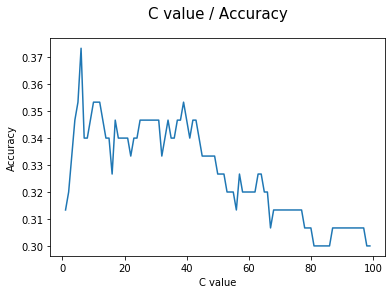

In [20]:
print("Highest accuracy: {} with C as value {}".format(highestAcc[1], highestAcc[0] ))
print("Lowest accuracy: {} with C as value {}".format(lowestAcc[1], lowestAcc[0] ))


plt.title("C value / Accuracy", fontsize=15, pad=20)
plt.xlabel("C value")
plt.ylabel("Accuracy")
plt.plot(range(1,100), allAcc)


## Using CV grid search in order to find best hyperparameters

In [35]:
# defining parameter range 
param_grid = {'C': [0.1, 1, 10, 20,30,40,50, 100,200,300, 1000], 'kernel': ['rbf'],'gamma':[ 0.05, 0.10,0.20,0.30,0.40,50,0.60,70,0.80,1] }


grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3, scoring='precision_micro', cv=10) 


# fitting the model for grid search 
grid.fit(X_train, y_train) 

# print how our model looks after hyper-parameter tuning 

print(grid.best_score_)
print(grid.best_estimator_) 


Fitting 10 folds for each of 110 candidates, totalling 1100 fits
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.256, total=   0.0s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.247, total=   0.0s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.259, total=   0.1s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.05, kernel=rbf ...................................
[CV] ....... C=0.1, gamma=0.05, kernel=rbf, score=0.253, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.256, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.224, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] .

[CV] ........ C=0.1, gamma=0.6, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.6, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.6, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.6, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.6, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.6, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.6, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.6, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.6, kernel=rbf, score=0.259, total=   0.0s
[CV] C=0.1, gamma=0.6, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.6, kernel=rbf, score=0.253, total=   0.0s
[CV] C=0.1, gamma=70, kernel=rbf .....................................
[CV] ......... C=0.1, gamma=70, kernel=rbf, score=0.256, total=   0.0s
[CV] C=0.1, gamma=70, kernel=rbf .....................................
[CV] .

[CV] .......... C=1, gamma=0.2, kernel=rbf, score=0.212, total=   0.0s
[CV] C=1, gamma=0.2, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.2, kernel=rbf, score=0.282, total=   0.0s
[CV] C=1, gamma=0.2, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.2, kernel=rbf, score=0.282, total=   0.0s
[CV] C=1, gamma=0.2, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.2, kernel=rbf, score=0.318, total=   0.0s
[CV] C=1, gamma=0.2, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.2, kernel=rbf, score=0.294, total=   0.0s
[CV] C=1, gamma=0.2, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.2, kernel=rbf, score=0.253, total=   0.0s
[CV] C=1, gamma=0.3, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.3, kernel=rbf, score=0.256, total=   0.0s
[CV] C=1, gamma=0.3, kernel=rbf ......................................
[CV] .

[CV] .......... C=1, gamma=0.8, kernel=rbf, score=0.282, total=   0.0s
[CV] C=1, gamma=0.8, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.8, kernel=rbf, score=0.247, total=   0.0s
[CV] C=1, gamma=0.8, kernel=rbf ......................................
[CV] .......... C=1, gamma=0.8, kernel=rbf, score=0.169, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] ............ C=1, gamma=1, kernel=rbf, score=0.267, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] ............ C=1, gamma=1, kernel=rbf, score=0.247, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] ............ C=1, gamma=1, kernel=rbf, score=0.247, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] ............ C=1, gamma=1, kernel=rbf, score=0.271, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] .

[CV] ......... C=10, gamma=0.4, kernel=rbf, score=0.271, total=   0.0s
[CV] C=10, gamma=0.4, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.4, kernel=rbf, score=0.259, total=   0.0s
[CV] C=10, gamma=0.4, kernel=rbf .....................................
[CV] ......... C=10, gamma=0.4, kernel=rbf, score=0.181, total=   0.0s
[CV] C=10, gamma=50, kernel=rbf ......................................
[CV] .......... C=10, gamma=50, kernel=rbf, score=0.244, total=   0.0s
[CV] C=10, gamma=50, kernel=rbf ......................................
[CV] .......... C=10, gamma=50, kernel=rbf, score=0.259, total=   0.0s
[CV] C=10, gamma=50, kernel=rbf ......................................
[CV] .......... C=10, gamma=50, kernel=rbf, score=0.247, total=   0.0s
[CV] C=10, gamma=50, kernel=rbf ......................................
[CV] .......... C=10, gamma=50, kernel=rbf, score=0.271, total=   0.1s
[CV] C=10, gamma=50, kernel=rbf ......................................
[CV] .

[CV] ........ C=20, gamma=0.05, kernel=rbf, score=0.282, total=   0.0s
[CV] C=20, gamma=0.05, kernel=rbf ....................................
[CV] ........ C=20, gamma=0.05, kernel=rbf, score=0.247, total=   0.0s
[CV] C=20, gamma=0.05, kernel=rbf ....................................
[CV] ........ C=20, gamma=0.05, kernel=rbf, score=0.301, total=   0.0s
[CV] C=20, gamma=0.1, kernel=rbf .....................................
[CV] ......... C=20, gamma=0.1, kernel=rbf, score=0.233, total=   0.0s
[CV] C=20, gamma=0.1, kernel=rbf .....................................
[CV] ......... C=20, gamma=0.1, kernel=rbf, score=0.212, total=   0.1s
[CV] C=20, gamma=0.1, kernel=rbf .....................................
[CV] ......... C=20, gamma=0.1, kernel=rbf, score=0.212, total=   0.1s
[CV] C=20, gamma=0.1, kernel=rbf .....................................
[CV] ......... C=20, gamma=0.1, kernel=rbf, score=0.259, total=   0.0s
[CV] C=20, gamma=0.1, kernel=rbf .....................................
[CV] .

KeyboardInterrupt: 

According to grid search the best paramters are C=40 and gamma 0.05



In [ ]:
svm_model = SVC(kernel='rbf', C=40, gamma=0.05)
svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)
print( classification_report(y_test, y_pred))

#print(y_pred[:20])
#print(y_test[:20])
acc = accuracy_score(y_test,y_pred)
print("Accuracy: ", acc )
cm = confusion_matrix(y_test, y_pred)
normalizedCm = cm.astype(float) / np.sum(cm, axis=0)

##Normalized confusion matrix
plt.figure(figsize=(5,5))
#Show confion matrix 
plt.title("Confusion matrix ", fontsize=18)
ax = sns.heatmap(cm, fmt='.2f', square=True, annot=True, cbar=False)
ax.set_ylim(5,0) #maked heatmap showiung all squares
plt.xlabel('predicted value', fontsize=15)
plt.ylabel('true value',  fontsize=15);

np.set_printoptions(precision=2)
##Normalized confusion matrix
plt.figure(figsize=(5,5))
#Show confion matrix 
plt.title("Normalized Confusion matrix ", fontsize=18)
ax = sns.heatmap(normalizedCm, fmt='.2f', square=True, annot=True, cbar=False)
ax.set_ylim(5,0) #maked heatmap showiung all squares
plt.xlabel('predicted value', fontsize=15)
plt.ylabel('true value',  fontsize=15);




## Different C-values


              precision    recall  f1-score   support

           0       0.30      0.49      0.37        37
           1       0.51      0.45      0.48        40
           2       0.27      0.31      0.29        29
           3       0.38      0.18      0.25        44

    accuracy                           0.35       150
   macro avg       0.37      0.36      0.35       150
weighted avg       0.37      0.35      0.35       150

Accuracy:  0.35333333333333333


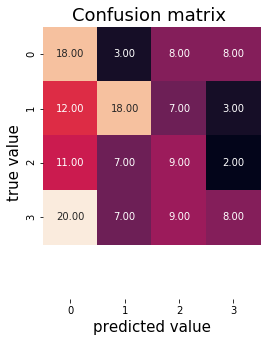

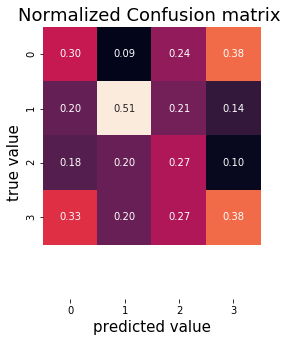

In [58]:
#svm_model = SVC(kernel='rbf', C=1, gamma='auto')
svm_model = SVC(kernel='rbf', C=5, gamma='auto')
#svm_model = SVC(kernel='rbf', C=100, gamma='auto')

svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)

print( classification_report(y_test, y_pred))
acc = accuracy_score(y_test,y_pred)
print("Accuracy: ", acc )
cm = confusion_matrix(y_test, y_pred)
normalizedCm = cm.astype(float) / np.sum(cm, axis=0)




##Normalized confusion matrix
plt.figure(figsize=(5,5))
#Show confion matrix 
plt.title("Confusion matrix ", fontsize=18)
ax = sns.heatmap(cm, fmt='.2f', square=True, annot=True, cbar=False)
ax.set_ylim(5,0) #maked heatmap showiung all squares
plt.xlabel('predicted value', fontsize=15)
plt.ylabel('true value',  fontsize=15);

np.set_printoptions(precision=2)
##Normalized confusion matrix
plt.figure(figsize=(5,5))
#Show confion matrix 
plt.title("Normalized Confusion matrix ", fontsize=18)
ax = sns.heatmap(normalizedCm, fmt='.2f', square=True, annot=True, cbar=False)
ax.set_ylim(5,0) #maked heatmap showiung all squares
plt.xlabel('predicted value', fontsize=15)
plt.ylabel('true value',  fontsize=15);

***
## Neural Network 

#### We do not run the networks with k-folds as its computational complexity would make the faster hyper parameter experimination suffer.

##### First Run

    first = 16 neurons +relu
    second = 8 +relu
    third = 8 + relu
    fourth = 4 + softmax (labels)
    
    


In [60]:
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.utils import to_categorical

Using TensorFlow backend.


## We have to one-hot encode y labels to

In [61]:
y_train = to_categorical(y_train) #RUN ONCE
y_test = to_categorical(y_test) #RUN ONCE


In [62]:

model= Sequential()
model.add(Dense(units=16, activation='relu', input_dim=7))
model.add(Dense(units=8, activation='relu',))
model.add(Dense(units=8, activation='relu',))
model.add(Dense(4, activation='softmax')) #One node for each category

model.summary()

model.compile(loss="categorical_crossentropy", optimizer='adam', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=200, verbose=2, batch_size=2, validation_data=(X_test,y_test)) ##Fit the data

pred = model.predict(X_test)

history.pred = pred


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 16)                128       
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_3 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_4 (Dense)              (None, 4)                 36        
Total params: 372
Trainable params: 372
Non-trainable params: 0
_________________________________________________________________

Train on 849 samples, validate on 150 samples
Epoch 1/200
 - 0s - loss: 1.4313 - accuracy: 0.2591 - val_loss: 1.4159 - val_accuracy: 0.1933
Epoch 2/200
 - 0s - loss: 1.3905 - accuracy: 0.2768 - val_loss: 1.3945 - val_accuracy: 0.2200
Epoch 3/200
 - 0s -

Epoch 76/200
 - 0s - loss: 1.2145 - accuracy: 0.4229 - val_loss: 1.4658 - val_accuracy: 0.2600
Epoch 77/200
 - 0s - loss: 1.2128 - accuracy: 0.4158 - val_loss: 1.4550 - val_accuracy: 0.2333
Epoch 78/200
 - 0s - loss: 1.2067 - accuracy: 0.4346 - val_loss: 1.5100 - val_accuracy: 0.2133
Epoch 79/200
 - 0s - loss: 1.2105 - accuracy: 0.4299 - val_loss: 1.4916 - val_accuracy: 0.2467
Epoch 80/200
 - 0s - loss: 1.2086 - accuracy: 0.4252 - val_loss: 1.4582 - val_accuracy: 0.2467
Epoch 81/200
 - 0s - loss: 1.2070 - accuracy: 0.4240 - val_loss: 1.4781 - val_accuracy: 0.2533
Epoch 82/200
 - 0s - loss: 1.2056 - accuracy: 0.4393 - val_loss: 1.4687 - val_accuracy: 0.2400
Epoch 83/200
 - 0s - loss: 1.2058 - accuracy: 0.4335 - val_loss: 1.4721 - val_accuracy: 0.2600
Epoch 84/200
 - 0s - loss: 1.1991 - accuracy: 0.4370 - val_loss: 1.4937 - val_accuracy: 0.2200
Epoch 85/200
 - 0s - loss: 1.2019 - accuracy: 0.4323 - val_loss: 1.4683 - val_accuracy: 0.2533
Epoch 86/200
 - 0s - loss: 1.1913 - accuracy: 0.45

Epoch 162/200
 - 0s - loss: 1.1210 - accuracy: 0.4865 - val_loss: 1.5830 - val_accuracy: 0.2600
Epoch 163/200
 - 0s - loss: 1.1239 - accuracy: 0.4829 - val_loss: 1.6192 - val_accuracy: 0.2733
Epoch 164/200
 - 0s - loss: 1.1254 - accuracy: 0.4912 - val_loss: 1.5515 - val_accuracy: 0.2533
Epoch 165/200
 - 0s - loss: 1.1243 - accuracy: 0.4841 - val_loss: 1.5858 - val_accuracy: 0.2733
Epoch 166/200
 - 0s - loss: 1.1287 - accuracy: 0.4888 - val_loss: 1.5706 - val_accuracy: 0.2733
Epoch 167/200
 - 0s - loss: 1.1189 - accuracy: 0.4782 - val_loss: 1.5600 - val_accuracy: 0.2800
Epoch 168/200
 - 0s - loss: 1.1211 - accuracy: 0.4711 - val_loss: 1.5906 - val_accuracy: 0.3133
Epoch 169/200
 - 0s - loss: 1.1235 - accuracy: 0.4782 - val_loss: 1.6051 - val_accuracy: 0.2733
Epoch 170/200
 - 0s - loss: 1.1168 - accuracy: 0.4759 - val_loss: 1.5869 - val_accuracy: 0.2733
Epoch 171/200
 - 0s - loss: 1.1196 - accuracy: 0.4817 - val_loss: 1.5989 - val_accuracy: 0.2600
Epoch 172/200
 - 0s - loss: 1.1229 - acc

***
## Evaluate

We are evaluating the runs by passing validaiton data which make us see how the validation loss/accuracy is evolving compared to the training loss/accuracy.

We define a function to plotter these relationship and also get a confusion matrix and classification report of the last epoch.

In [ ]:
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

### Training loss/ Accuracy    

def evaluate_mode(model):

    plt.figure()
    plt.plot(model.history['loss'])
    plt.title('Model loss/accuracy - training', fontsize=18)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Loss'], loc='upper left')
    plt2=plt.twinx()
    color = 'red'
    plt2.plot(model.history['accuracy'],color=color)
    plt.ylabel('Accuracy')
    plt2.legend(['Accuracy'], loc='upper center')
    plt.show()


    plt.figure()
    
        
    y_compare = [np.argmax(x) for x in y_test] #ecode from one-hot encoding
    pred = [np.argmax(x) for x in model.pred] #ecode from one-hot encoding
    
    ##Confusion amtrix
    cm = confusion_matrix(y_compare, pred) ##For evaluation later
    normalizedCm = cm.astype(float) / np.sum(cm, axis=1)[:,np.newaxis]
 
    

            
    plt.figure(figsize=(5,5))
    #Show confion matrix for last epoch 
    plt.title("Confusion matrix", fontsize=18)
    ax = sns.heatmap(cm, fmt='g', square=True, annot=True, cbar=False)
    ax.set_ylim(4,0) #maked heatmap showiung all squares
    plt.xlabel('predicted value', fontsize=15)
    plt.ylabel('true value',  fontsize=15);
    
    
    ##Normalized confusion matrix
    plt.figure(figsize=(5,5))
    #Show confion matrix for last epoch 
    plt.title("Normalized Confusion matrix", fontsize=18)
    ax = sns.heatmap(normalizedCm, fmt='.2f', square=True, annot=True, cbar=False)
    ax.set_ylim(4,0) #maked heatmap showiung all squares
    plt.xlabel('predicted value', fontsize=15)
    plt.ylabel('true value',  fontsize=15);

        
    plt.figure()
    ### Validation loss/ Accuracy 
    plt.plot(model.history['val_loss'])
    plt.title('Model loss/accuracy - validation', fontsize=18)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Loss'], loc='upper left')
    plt2=plt.twinx()
    color = 'red'
    plt2.plot(model.history['val_accuracy'],color=color)
    plt.ylabel('Accuracy')
    plt2.legend(['Accuracy'], loc='upper center')
    plt.show()

    ##Examine the probability distrubtion of the softmax output
    np.set_printoptions(suppress=True)

 
    print(classification_report(y_compare, pred))
    
    
    

    #fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test.ravel(), model.pred.ravel())
    #auc_keras = auc(fpr_keras, tpr_keras)
    #plt.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
    #plt.xlabel('False positive rate')
    #plt.ylabel('True positive rate')
    #plt.title('ROC curve')
    #plt.legend(loc='best')
    
